<a href="https://colab.research.google.com/github/Cov4/Cov4/blob/main/ssc_busniess_f_regression_XAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install mrmr_selection

from pandas import read_excel
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# %matplotlib inline

import scipy
import statsmodels.formula.api as smf
import statsmodels.api as sm

from mrmr import mrmr_classif

import sklearn
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split
from sklearn import model_selection, preprocessing, feature_selection, ensemble, linear_model, metrics, decomposition
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, explained_variance_score, max_error
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, mean_absolute_percentage_error, d2_tweedie_score

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 2.8 MB/s eta 0:00:00


In [10]:
df = pd.ExcelFile('/content/drive/MyDrive/2학년 2학기/Group_prediction_by_Regressor-Dataset.xlsx')
df.sheet_names


['Science', 'Business Studies', 'Humanities']

In [11]:
df1 = pd.read_excel('/content/drive/MyDrive/2학년 2학기/Group_prediction_by_Regressor-Dataset.xlsx', sheet_name = 'Science')

In [12]:
df1

,Gender,Father Highest Academic Qualification,Mother Highest Academic Qualification,Father Profession,Mother Profession,Father average monthly income,Mother average monthly income,How many siblings do you have,District Currently you are living,PEC Result Overall GPA,...,JSC Overall GPA,JSC Bangla,JSC English,JSC Mathematics,JSC BGS,JSC ICT,JSC Religion,JSC Science,Group SSC,Overall GPA SSC
0,0,4,2,0,2,20000,0,3,0,5.00,...,5.00,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,5.00
1,0,5,3,2,2,57000,0,1,0,5.00,...,5.00,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,5.00
2,0,4,2,1,2,100000,80000,2,1,5.00,...,4.65,4.0,4.0,5.0,4.0,5.0,4.0,5.0,0,4.11
3,0,5,5,1,2,400000,100000,1,0,5.00,...,5.00,4.0,5.0,5.0,5.0,5.0,5.0,5.0,0,4.61
4,1,0,0,1,2,50000,0,3,0,5.00,...,4.30,4.0,4.0,5.0,5.0,4.0,4.0,5.0,0,4.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169,1,0,0,1,2,5000,0,3,0,3.08,...,3.00,3.0,2.0,1.0,2.0,3.5,3.0,3.5,0,4.06
170,0,5,4,0,2,35000,0,2,0,5.00,...,4.70,4.0,5.0,3.0,3.0,4.0,4.0,4.0,0,4.23
171,0,4,4,0,2,220000,0,2,1,5.00,...,4.63,4.0,5.0,5.0,4.0,5.0,4.0,5.0,0,5.00
172,1,2,0,1,2,4000,2000,1,2,5.00,...,4.69,5.0,3.5,3.5,5.0,5.0,5.0,3.5,0,4.39


In [13]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174 entries, 0 to 173
Data columns (total 26 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Gender                                 174 non-null    int64  
 1   Father Highest Academic Qualification  174 non-null    int64  
 2   Mother Highest Academic Qualification  174 non-null    int64  
 3   Father Profession                      174 non-null    int64  
 4   Mother Profession                      174 non-null    int64  
 5   Father average monthly income          174 non-null    int64  
 6   Mother average monthly income          174 non-null    int64  
 7   How many siblings do you have          174 non-null    int64  
 8   District Currently you are living      174 non-null    int64  
 9   PEC Result Overall GPA                 174 non-null    float64
 10  PEC  Bangla                            174 non-null    float64
 11  PEC En

In [14]:
df1.isnull().sum()

,0
Gender,0
Father Highest Academic Qualification,0
Mother Highest Academic Qualification,0
Father Profession,0
Mother Profession,0
Father average monthly income,0
Mother average monthly income,0
How many siblings do you have,0
District Currently you are living,0
PEC Result Overall GPA,0


In [16]:
pip install fasteda

  Preparing metadata (setup.py) ... done
  Created wheel for fasteda: filename=fasteda-1.0.1-py3-none-any.whl size=4723 sha256=4e7c86b29e10e0039029ba95640fa8c67e18f673f711d2857965dec8a30d02a8
  Stored in directory: /root/.cache/pip/wheels/ed/08/72/0d0ec0d3927d227b38ce9542ec3fa6b975c2e17ad0d046dcee
Successfully built fasteda


In [17]:
from fasteda import fast_eda

DataFrame Head:


,Gender,Father Highest Academic Qualification,Mother Highest Academic Qualification,Father Profession,Mother Profession,Father average monthly income,Mother average monthly income,How many siblings do you have,District Currently you are living,PEC Result Overall GPA,PEC Bangla,PEC English,PEC Mathematics,PEC Religion,PEC BGS,PEC Science,JSC Overall GPA,JSC Bangla,JSC English,JSC Mathematics,JSC BGS,JSC ICT,JSC Religion,JSC Science,Group SSC,Overall GPA SSC
0,0,4,2,0,2,20000,0,3,0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.00,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,5.00
1,0,5,3,2,2,57000,0,1,0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.00,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,5.00
2,0,4,2,1,2,100000,80000,2,1,5.0,5.0,5.0,5.0,5.0,5.0,5.0,4.65,4.0,4.0,5.0,4.0,5.0,4.0,5.0,0,4.11


DataFrame Tail:


,Gender,Father Highest Academic Qualification,Mother Highest Academic Qualification,Father Profession,Mother Profession,Father average monthly income,Mother average monthly income,How many siblings do you have,District Currently you are living,PEC Result Overall GPA,PEC Bangla,PEC English,PEC Mathematics,PEC Religion,PEC BGS,PEC Science,JSC Overall GPA,JSC Bangla,JSC English,JSC Mathematics,JSC BGS,JSC ICT,JSC Religion,JSC Science,Group SSC,Overall GPA SSC
171,0,4,4,0,2,220000,0,2,1,5.0,5.0,5.0,5.0,5.0,5.0,5.0,4.63,4.0,5.0,5.0,4.0,5.0,4.0,5.0,0,5.00
172,1,2,0,1,2,4000,2000,1,2,5.0,5.0,5.0,5.0,5.0,5.0,5.0,4.69,5.0,3.5,3.5,5.0,5.0,5.0,3.5,0,4.39
173,1,5,5,0,0,80000,20000,1,6,5.0,5.0,5.0,5.0,5.0,5.0,5.0,4.86,5.0,5.0,5.0,4.0,5.0,5.0,5.0,0,5.00


----------------------------------------------------------------------------------------------------
Missing values:


,0


----------------------------------------------------------------------------------------------------
Shape of DataFrame:

(174, 26)

----------------------------------------------------------------------------------------------------
DataFrame Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174 entries, 0 to 173
Data columns (total 26 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Gender                                 174 non-null    int64  
 1   Father Highest Academic Qualification  174 non-null    int64  
 2   Mother Highest Academic Qualification  174 non-null    int64  
 3   Father Profession                      174 non-null    int64  
 4   Mother Profession                      174 non-null    int64  
 5   Father average monthly income          174 non-null    int64  
 6   Mother average monthly income          174 non-null    int64  
 7   How many siblings do you ha

,count,mean,median,std,min,25%,50%,75%,max,skewness,kurtosis
Gender,174,0.517,1,0.501,0,0,1,1,1,-0.069007,-1.995238
Father Highest Academic Qualification,174,3.276,4,1.677,0,3,4,5,6,-0.853038,-0.418597
Mother Highest Academic Qualification,174,2.753,3,1.544,0,2,3,4,5,-0.338117,-0.753974
Father Profession,174,0.753,1,0.664,0,0,1,1,2,0.321112,-0.779803
Mother Profession,174,1.747,2,0.64,0,2,2,2,2,-2.242193,3.218282
Father average monthly income,174,65669.54,35000,122335.492,0,18000,35000,70000,1200000,6.273925,48.605666
Mother average monthly income,174,9813.218,0,35710.758,0,0,0,2750,400000,8.192926,81.876265
How many siblings do you have,174,2.098,2,1.35,0,1,2,3,7,0.839574,0.848971
District Currently you are living,174,1.816,1,2.375,0,0,1,2,7,1.083777,-0.352941
PEC Result Overall GPA,174,4.792,5,0.401,3,4.75,5,5,5,-2.325239,5.312900


----------------------------------------------------------------------------------------------------
DataFrame Correlation:



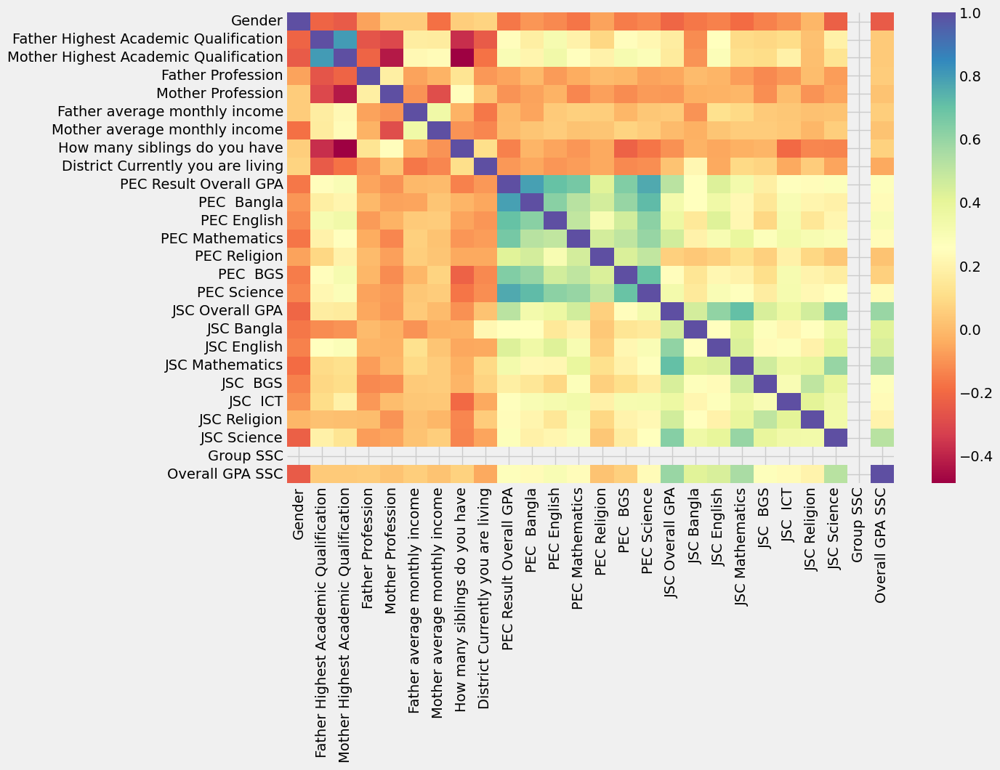

----------------------------------------------------------------------------------------------------
Histogram(s) & Boxplot(s):



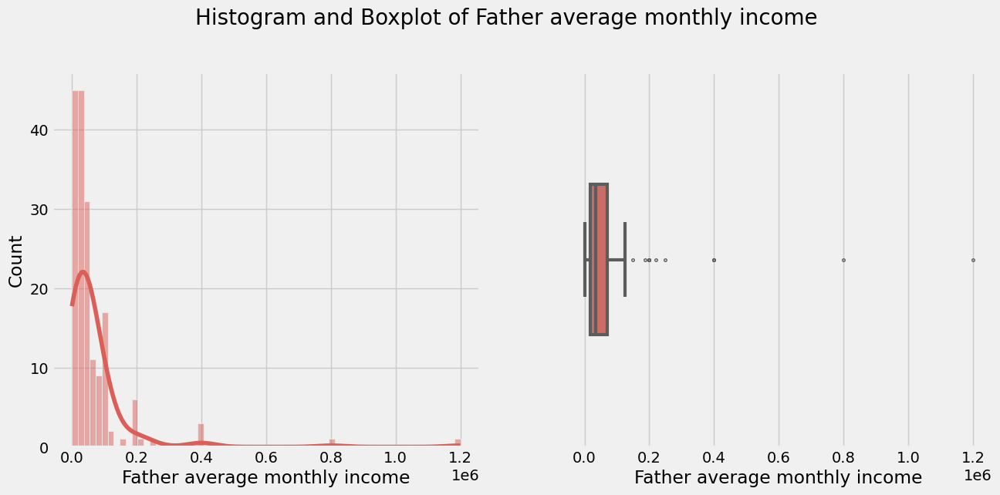

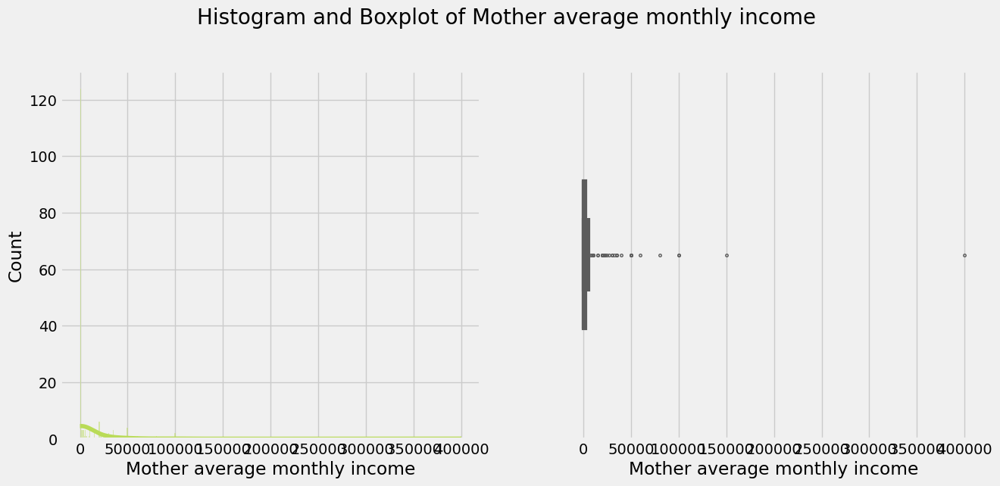

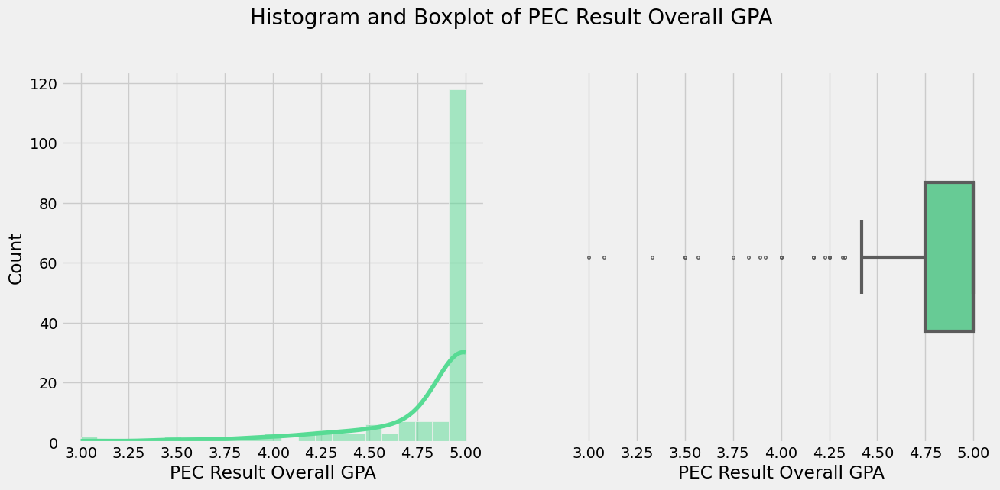

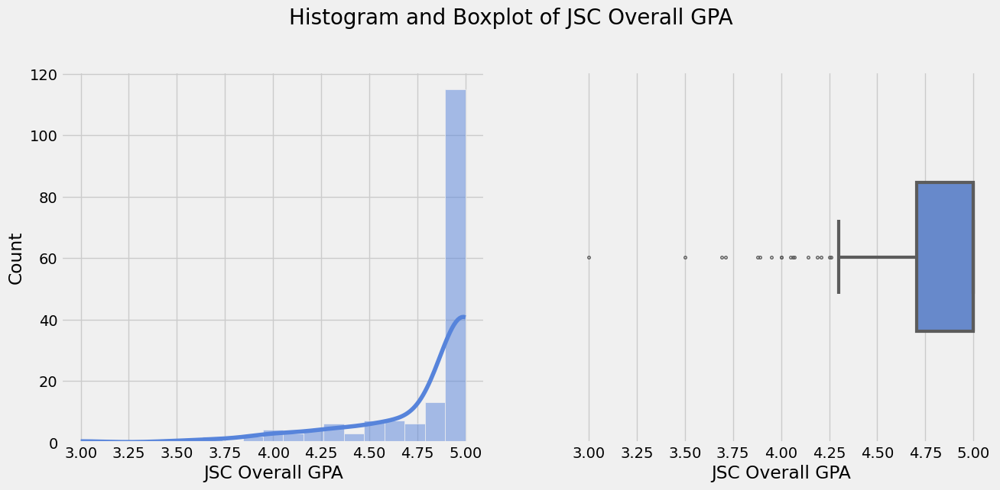

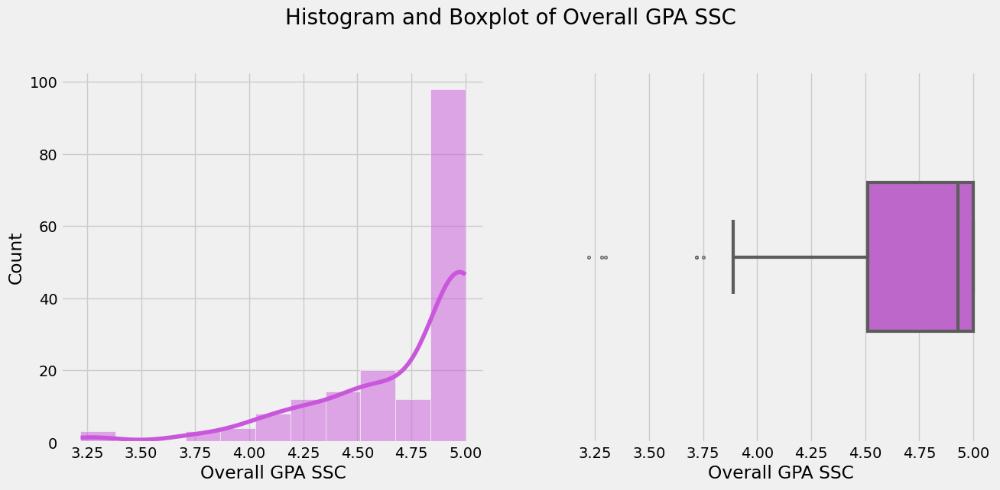

----------------------------------------------------------------------------------------------------
Countplot(s):



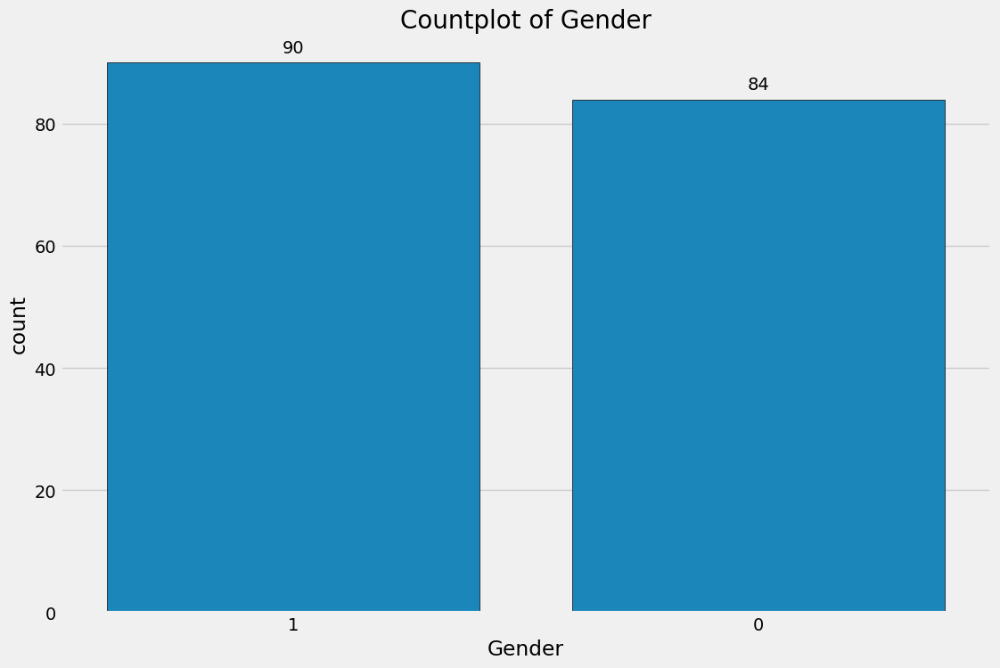

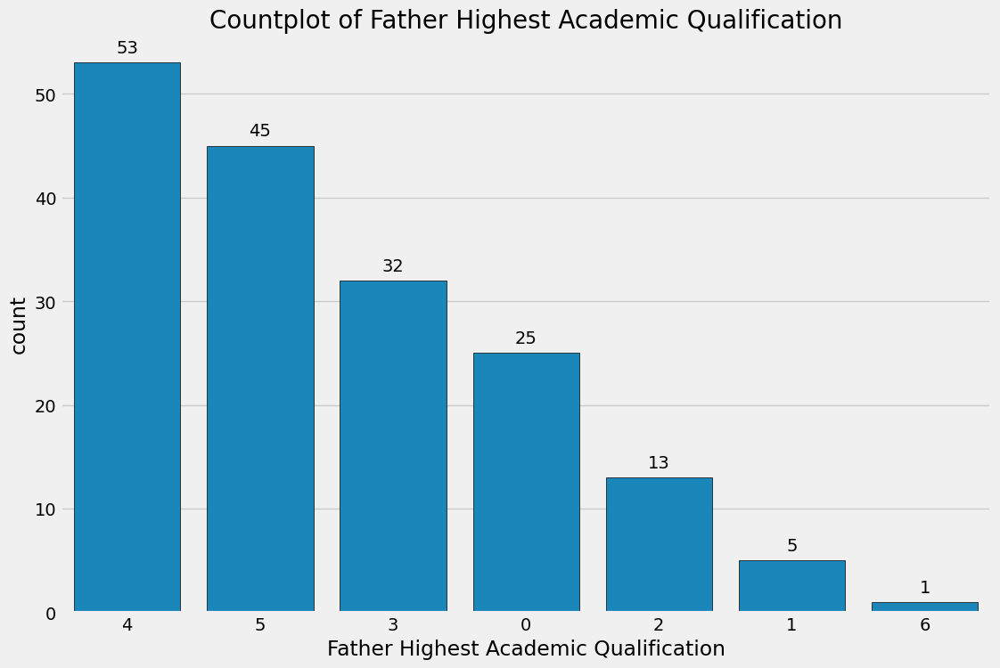

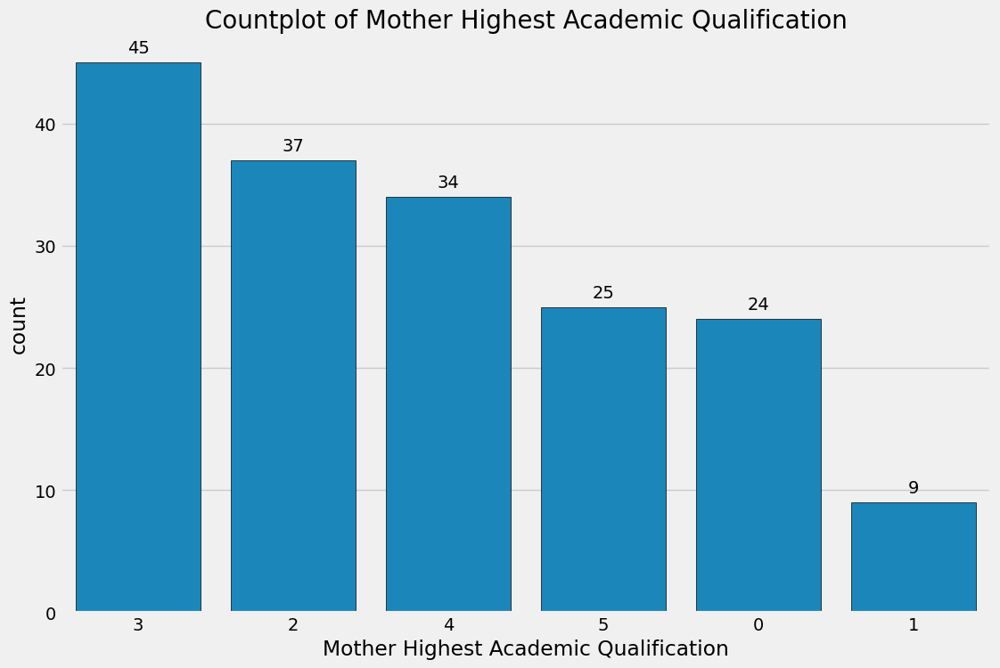

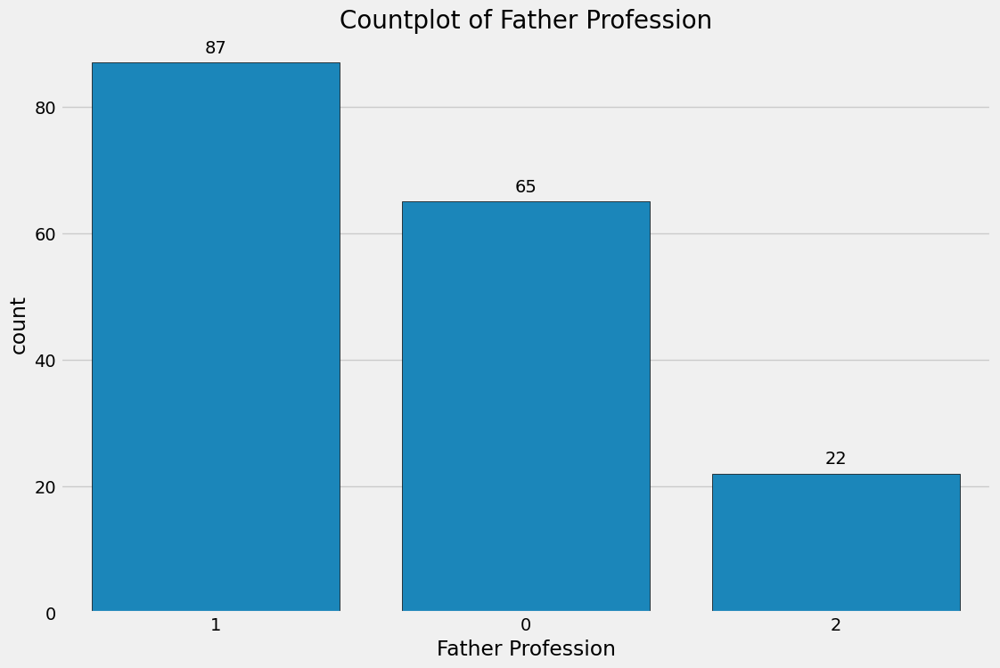

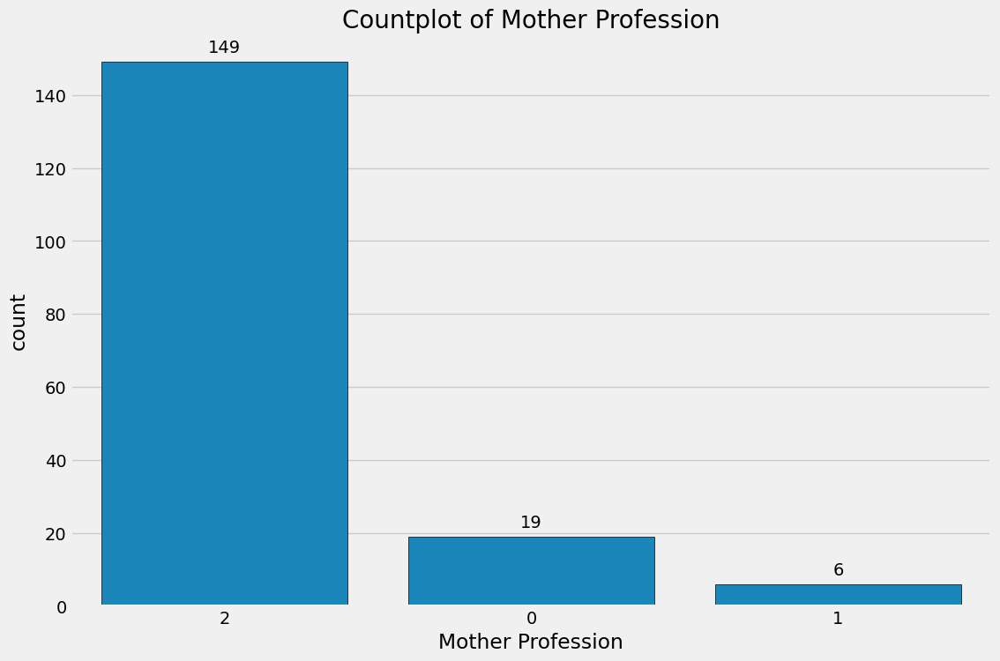

...

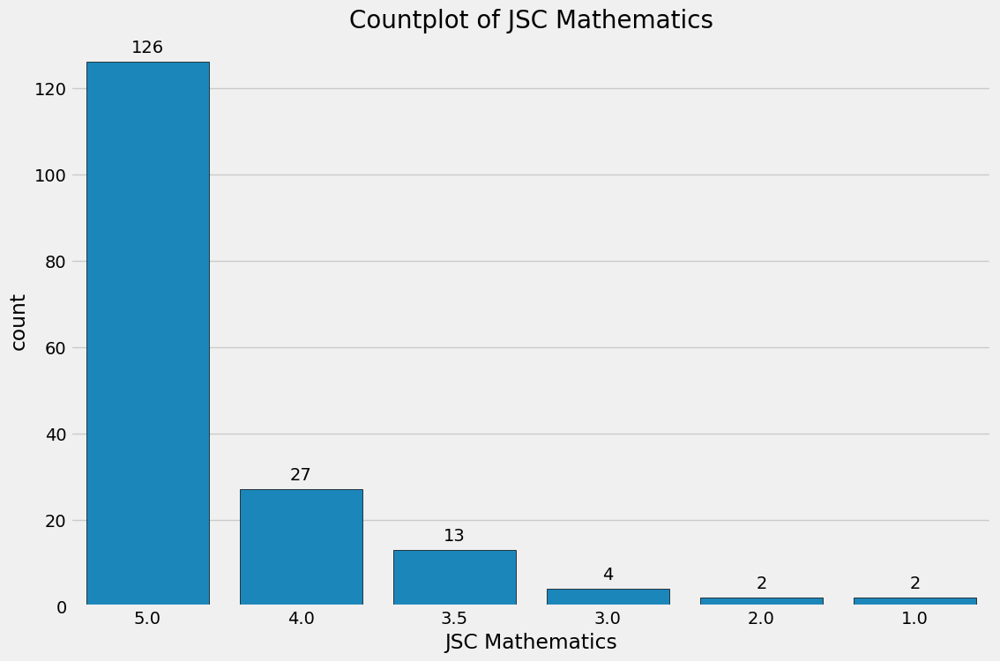

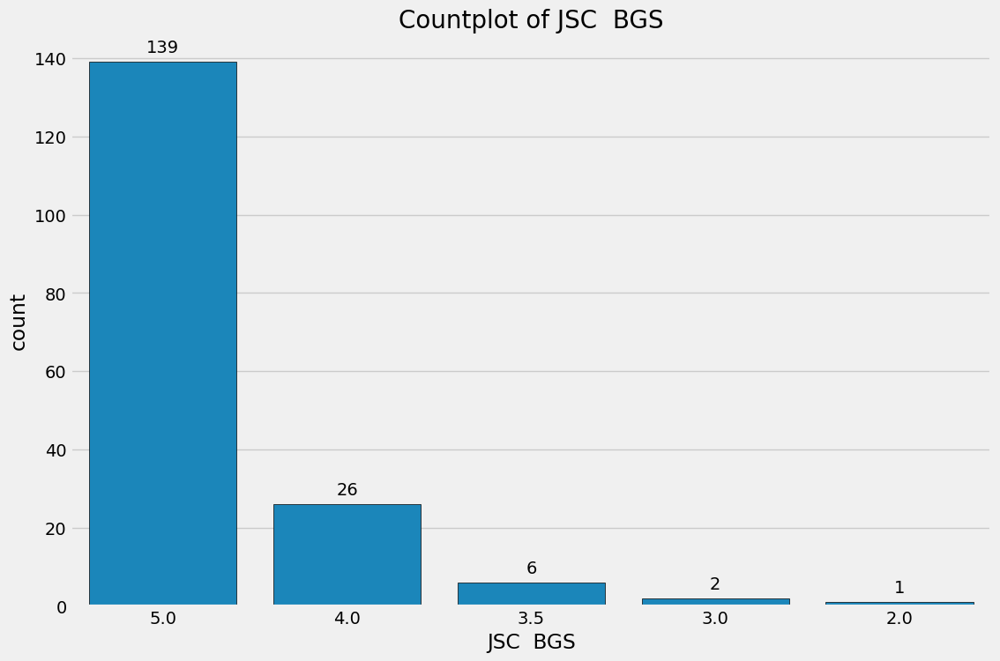

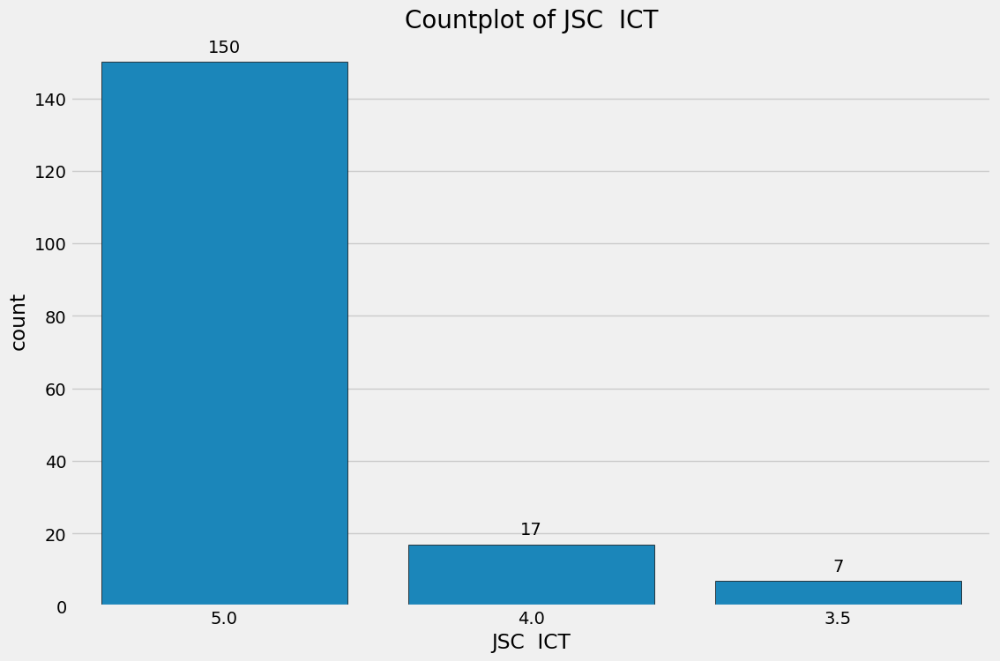

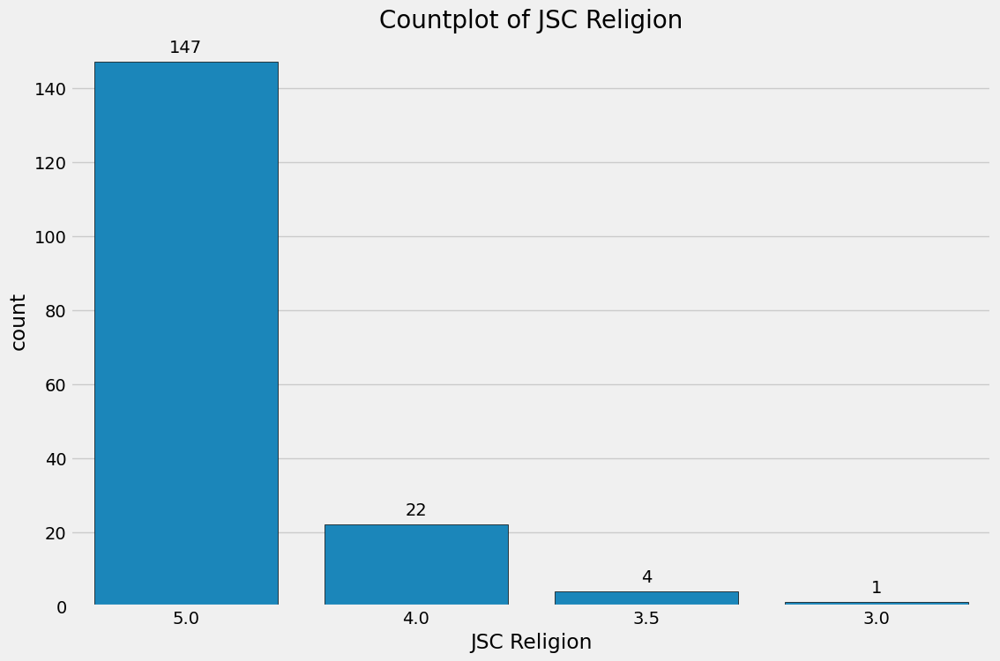

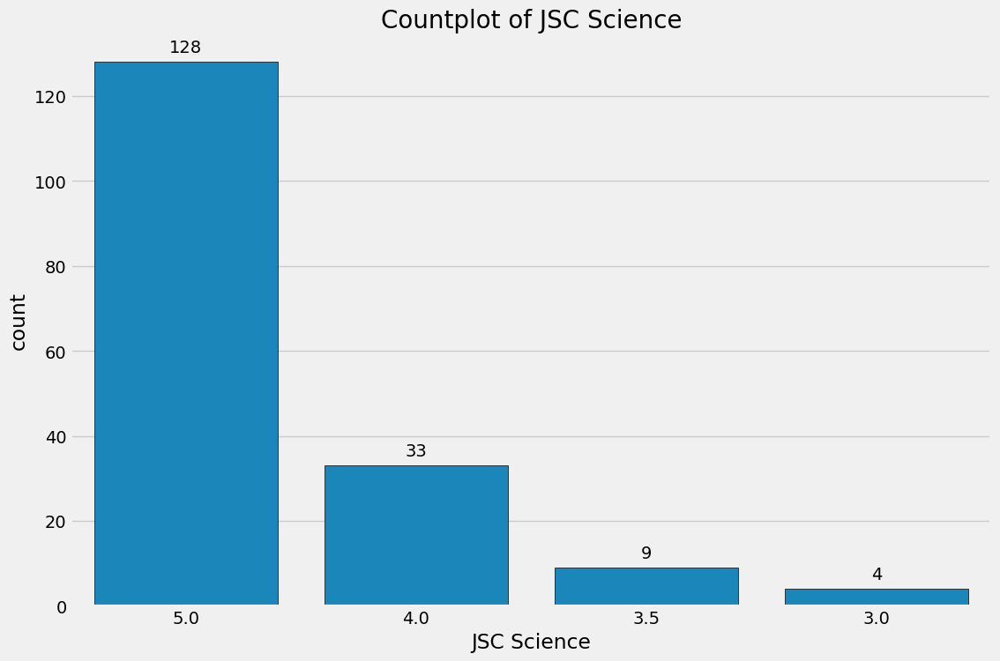

<Figure size 1200x800 with 0 Axes>

In [19]:
fast_eda(df1)

In [20]:
df1.columns

Index(['Gender', 'Father Highest Academic Qualification',
       'Mother Highest Academic Qualification', 'Father Profession',
       'Mother Profession', 'Father average monthly income',
       'Mother average monthly income', 'How many siblings do you have',
       'District Currently you are living', 'PEC Result Overall GPA',
       'PEC  Bangla', 'PEC English', 'PEC Mathematics', 'PEC Religion',
       'PEC  BGS', 'PEC Science', 'JSC Overall GPA', 'JSC Bangla',
       'JSC English', 'JSC Mathematics', 'JSC  BGS', 'JSC  ICT',
       'JSC Religion', 'JSC Science', 'Group SSC', 'Overall GPA SSC'],
      dtype='object')

In [26]:
y= df1.iloc[:,-1]
x= df1.iloc[:,0:-1]

In [27]:
y

,Overall GPA SSC
0,5.00
1,5.00
2,4.11
3,4.61
4,4.50
...,...
169,4.06
170,4.23
171,5.00
172,4.39


In [28]:
x

,Gender,Father Highest Academic Qualification,Mother Highest Academic Qualification,Father Profession,Mother Profession,Father average monthly income,Mother average monthly income,How many siblings do you have,District Currently you are living,PEC Result Overall GPA,PEC Bangla,PEC English,PEC Mathematics,PEC Religion,PEC BGS,PEC Science,JSC Overall GPA,JSC Bangla,JSC English,JSC Mathematics,JSC BGS,JSC ICT,JSC Religion,JSC Science,Group SSC
0,0,4,2,0,2,20000,0,3,0,5.00,5.0,5.0,5.0,5.0,5.0,5.0,5.00,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0
1,0,5,3,2,2,57000,0,1,0,5.00,5.0,5.0,5.0,5.0,5.0,5.0,5.00,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0
2,0,4,2,1,2,100000,80000,2,1,5.00,5.0,5.0,5.0,5.0,5.0,5.0,4.65,4.0,4.0,5.0,4.0,5.0,4.0,5.0,0
3,0,5,5,1,2,400000,100000,1,0,5.00,4.0,5.0,5.0,5.0,5.0,5.0,5.00,4.0,5.0,5.0,5.0,5.0,5.0,5.0,0
4,1,0,0,1,2,50000,0,3,0,5.00,5.0,5.0,5.0,5.0,5.0,5.0,4.30,4.0,4.0,5.0,5.0,4.0,4.0,5.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169,1,0,0,1,2,5000,0,3,0,3.08,3.5,3.0,3.0,5.0,3.5,3.5,3.00,3.0,2.0,1.0,2.0,3.5,3.0,3.5,0
170,0,5,4,0,2,35000,0,2,0,5.00,5.0,5.0,5.0,5.0,5.0,5.0,4.70,4.0,5.0,3.0,3.0,4.0,4.0,4.0,0
171,0,4,4,0,2,220000,0,2,1,5.00,5.0,5.0,5.0,5.0,5.0,5.0,4.63,4.0,5.0,5.0,4.0,5.0,4.0,5.0,0
172,1,2,0,1,2,4000,2000,1,2,5.00,5.0,5.0,5.0,5.0,5.0,5.0,4.69,5.0,3.5,3.5,5.0,5.0,5.0,3.5,0


In [31]:
from sklearn.svm import SVC
X_train, X_test, y_train, y_test = train_test_split(x,y, test_size = 0.25, random_state = 0)

len(y_test)

44

In [33]:
len(X_train)

130

In [35]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(random_state = 0)
model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=0)

In [36]:
y_pred = model.predict(X_test)

In [37]:
from sklearn import metrics
print("MAE", metrics.mean_absolute_error(y_test, y_pred))
print("MSE", metrics.mean_squared_error(y_test, y_pred))
print("RMSE", np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("Score:", model.score(X_test, y_test))

MAE 0.30250000000000005
MSE 0.19507500000000008
RMSE 0.4416729559300638
Score: -0.09628199307743168


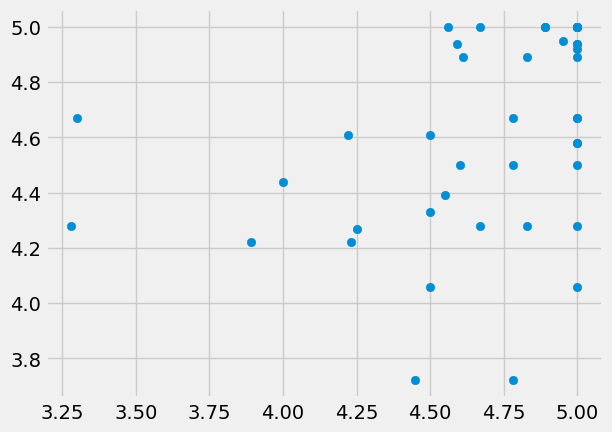

In [39]:
plt.scatter(y_test,y_pred)

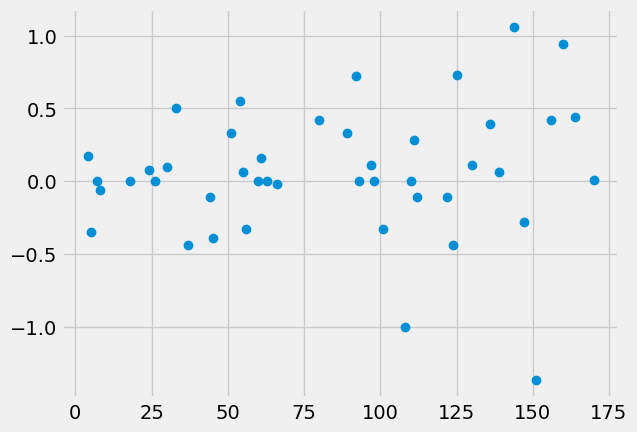

In [43]:
plt.plot(y_test-y_pred,'o')

In [51]:
from sklearn.model_selection import train_test_split
X1_train, X1_test, y1_train, y1_test = train_test_split(x, y, test_size = 0.25, random_state = 0)
y1_train = y1_train.values.reshape(-1, 1)
y1_test = y1_test.values.reshape(-1, 1)

In [52]:
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()
X1_train = sc_X.fit_transform(X1_train)
X1_test = sc_X.fit_transform(X1_test)



y1_train= sc_y.fit_transform(y1_train)
y1_test = sc_y.fit_transform(y1_test)

In [53]:
from sklearn.svm import SVR
model1 = SVR(kernel = 'rbf')
model1.fit(X1_train, y1_train)

SVR()

In [54]:
y1_pred = model.predict(X1_test)

In [55]:
y1_pred = model.predict(X1_test)

In [57]:
y1_pred = sc_y.transform(y1_pred)

ValueError: Expected 2D array, got 1D array instead:
array=[3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72
 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72
 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72 3.72
 3.72 3.72].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [58]:
print("MAE", metrics.mean_absolute_error(y1_test, y1_pred))
print("MSE", metrics.mean_squared_error(y1_test, y1_pred))
print("RMSE", np.sqrt(metrics.mean_squared_error(y1_test, y1_pred)))
print("Score:", model.score(X1_test, y1_test))

MAE 3.719999999999999
MSE 14.838399999999991
RMSE 3.8520643816011164
Score: -13.838399999999995


In [64]:
from sklearn.ensemble import RandomForestRegressor
model2 = RandomForestRegressor(n_estimators = 500, criterion = 'squared_error', random_state = 0)
model2.fit(X_train, y_train)

RandomForestRegressor(n_estimators=500, random_state=0)

Text(0.5, 0, 'Permutation Importance')

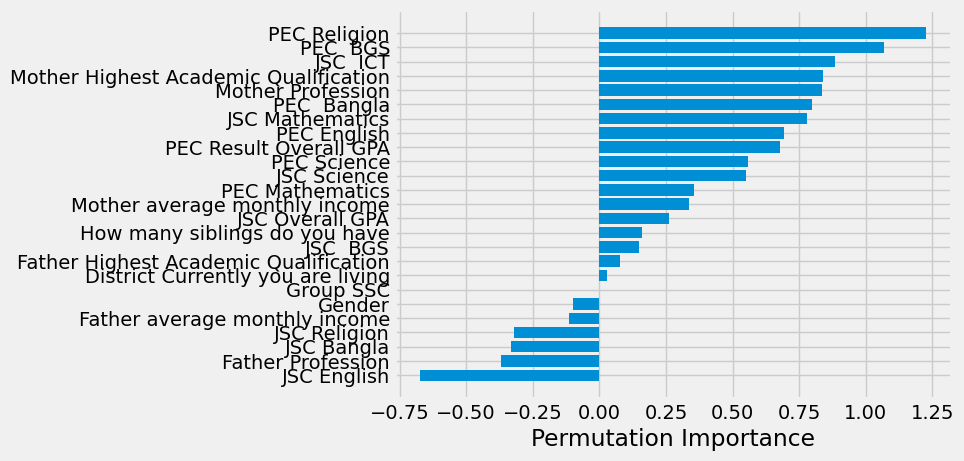

In [67]:
from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(model1, X_test, y_test)
feature_names = list(df1.columns)
#feature_names = ['Gender', 'F Edu', 'M Edu', 'F Prof', 'M Prof', 'F Avg Inc', 'M Avg Inc', 'Siblings', 'Distri','Pec Res Ov' ,'Pec Bangla','Pec English', 'Pec Math', 'Pec Reli', 'Pec BGS', 'Pec Sci', 'Jsc Res Ov','Jsc Bangla','Jsc english','Jsc Math','Jsc bgs','jsc ict','jsc reli', 'jsc sci']
features = np.array(feature_names)

sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

In [70]:
# import shap library
import shap

# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(model2)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation
# shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values[0,:], X_train[0])
# visualize the first prediction's explanation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train[0,:])

In [72]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=213dc2e3f6103a8478f6d045a3429c1ead61a21dfeda4a54271b5ceb859d4971
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [74]:
import lime
import lime.lime_tabular
# LIME has one explainer for all the models
# explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names= feature_names,
#                                                   class_names=['MEDV'], verbose=True, mode='regression')
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names= feature_names,
                                                  class_names=['MEDV'], verbose=True, mode='regression')

In [79]:
j = 16
# exp = explainer.explain_instance(X_test[j], rf_regressor.predict, num_features=6)
exp = explainer.explain_instance(X_test[j], model1.predict, num_features=6)

# Show the predictions
exp.show_in_notebook(show_table=True)

Intercept 0.07292813568603668
Prediction_local [0.02095927]
Right: 0.3234973082985392


In [66]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df.shape

(110, 25)

In [ ]:
df.corr()

,Gender,Father Highest Academic Qualification,Mother Highest Academic Qualification,Father Profession,Mother Profession,Father average monthly income,Mother average monthly income,How many siblings do you have,District Currently you are living,PEC Result Overall GPA,...,PEC Science,JSC Overall GPA,JSC Bangla,JSC English,JSC Mathematics,JSC BGS,JSC ICT,JSC Religion,JSC Science,Overall GPA SSC
Gender,1.000000,-0.081295,-0.107227,0.090355,-0.088419,0.093381,0.228239,0.154943,-0.036972,-0.161126,...,-0.153014,-0.097031,0.016578,-0.084379,-0.126242,-0.056928,-0.047837,0.022099,0.096596,-0.192225
Father Highest Academic Qualification,-0.081295,1.000000,0.683826,-0.271755,-0.171130,-0.052933,0.106863,-0.198084,-0.129379,0.236939,...,0.110079,0.186859,0.078415,0.170806,0.161183,0.205653,0.156833,0.135501,0.213394,0.141957
Mother Highest Academic Qualification,-0.107227,0.683826,1.000000,-0.238954,-0.329890,0.166602,0.181808,-0.341734,-0.098468,0.157870,...,0.085735,0.160065,0.119171,0.148674,0.109985,0.072761,0.156131,0.112948,0.088620,0.152090
Father Profession,0.090355,-0.271755,-0.238954,1.000000,0.111754,0.007282,0.067437,-0.020222,0.089230,-0.032259,...,-0.029677,-0.146424,-0.055802,-0.190883,-0.083285,-0.113753,-0.036680,-0.076913,-0.217849,-0.096282
Mother Profession,-0.088419,-0.171130,-0.329890,0.111754,1.000000,0.073690,-0.268414,0.111442,-0.236824,0.190539,...,0.166911,0.143468,0.123105,0.095287,0.211951,0.034677,0.099120,0.022976,0.079476,0.054157
Father average monthly income,0.093381,-0.052933,0.166602,0.007282,0.073690,1.000000,0.239253,0.102617,-0.190223,0.055319,...,0.064494,0.067324,0.035399,0.144795,0.175974,0.015359,0.160332,0.076073,0.133319,0.058652
Mother average monthly income,0.228239,0.106863,0.181808,0.067437,-0.268414,0.239253,1.000000,0.063808,-0.087582,0.031691,...,0.143073,0.095420,0.000915,0.196458,0.034069,0.158087,0.163914,0.096180,0.129885,0.088336
How many siblings do you have,0.154943,-0.198084,-0.341734,-0.020222,0.111442,0.102617,0.063808,1.000000,-0.131987,0.006333,...,-0.057889,-0.033289,-0.099346,0.010575,0.015602,-0.100828,-0.051858,0.083715,0.058046,-0.011914
District Currently you are living,-0.036972,-0.129379,-0.098468,0.089230,-0.236824,-0.190223,-0.087582,-0.131987,1.000000,-0.474890,...,-0.392319,-0.412657,-0.315494,-0.412267,-0.299997,-0.275815,-0.410724,-0.396826,-0.194846,-0.184819
PEC Result Overall GPA,-0.161126,0.236939,0.157870,-0.032259,0.190539,0.055319,0.031691,0.006333,-0.474890,1.000000,...,0.679669,0.767519,0.536527,0.664205,0.555825,0.519548,0.538811,0.522251,0.345772,0.767096


<Axes: >

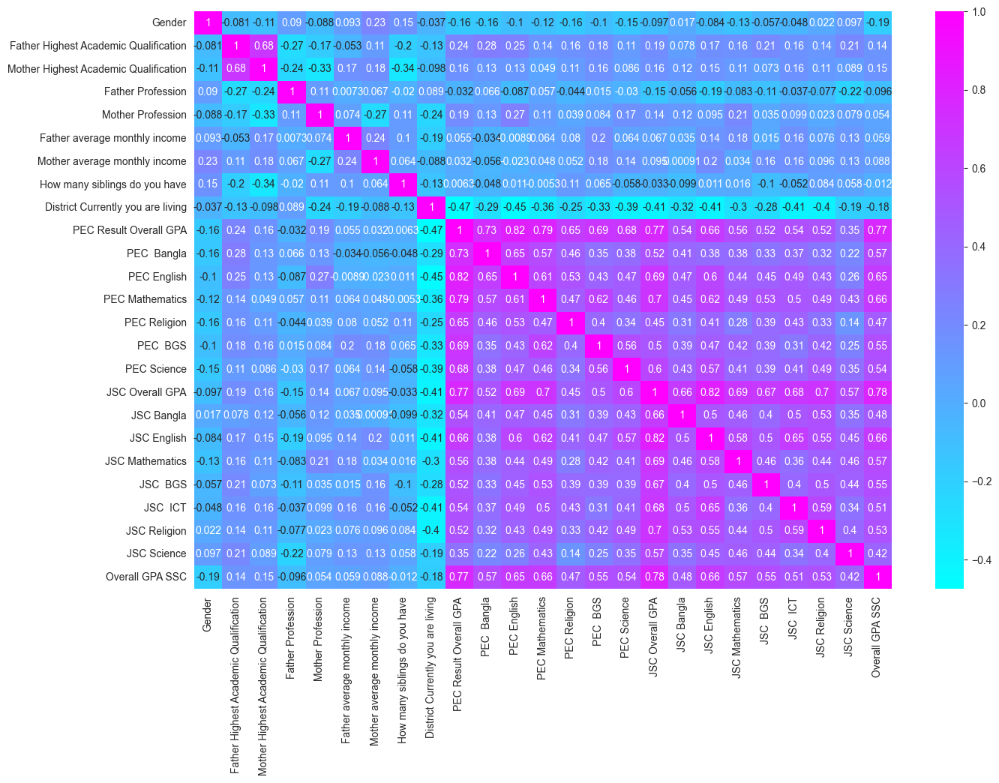

In [ ]:
figure = plt.figure(figsize=(15, 10))
sns.heatmap(df.corr(), annot=True,cmap=plt.cm.cool)

In [ ]:
X = df.drop(columns=['Overall GPA SSC'],axis=1)
y = df['Overall GPA SSC']

from sklearn.feature_selection import f_regression

# inputs:
#    X: pandas.DataFrame, features
#    y: pandas.Series, target variable
#    K: number of features to select

# compute F-statistics and initialize correlation matrix
F = pd.Series(f_regression(X, y)[0], index = X.columns)
corr = pd.DataFrame(.00001, index = X.columns, columns = X.columns)

In [ ]:
# initialize list of selected features and list of excluded features
selected = []
not_selected = X.columns.to_list()
scores = []

K = 10
# repeat K times
for i in range(K):

    # compute (absolute) correlations between the last selected feature and all the (currently) excluded features
    if i > 0:
        last_selected = selected[-1]
        corr.loc[not_selected, last_selected] = X[not_selected].corrwith(X[last_selected]).abs().clip(.00001)

    # compute FCQ score for all the (currently) excluded features (this is Formula 2)
    score = F.loc[not_selected] / corr.loc[not_selected, selected].mean(axis = 1).fillna(.00001)

    # find best feature, add it to selected and remove it from not_selected
    if not i==0:
        scores.append(score)
    best = score.index[score.argmax()]
    selected.append(best)
    not_selected.remove(best)

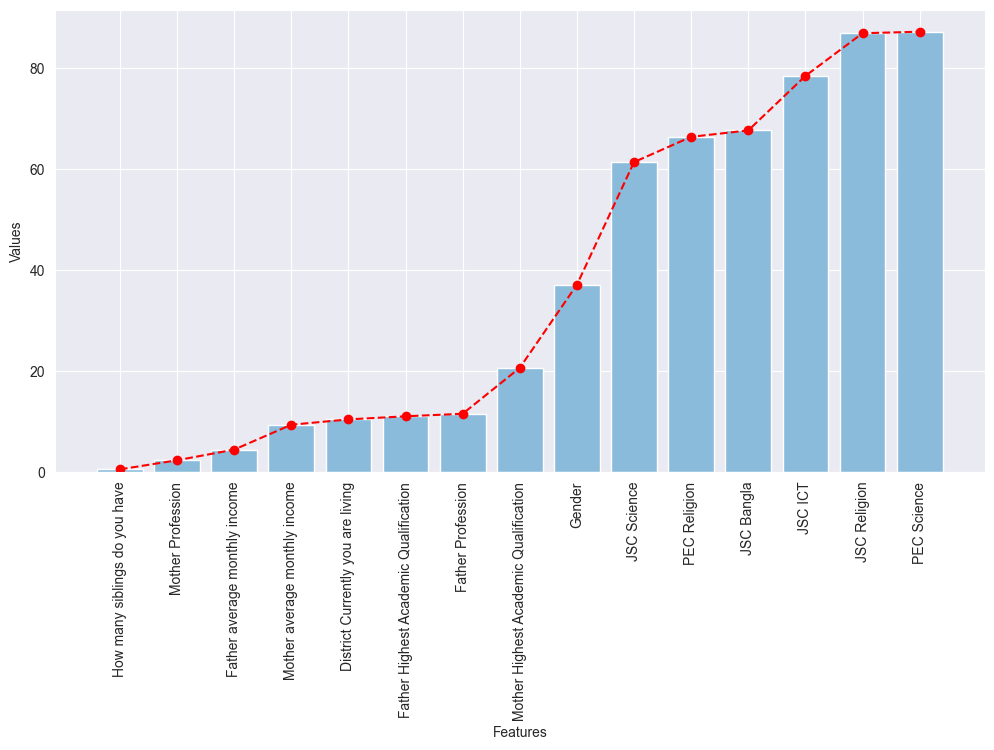

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

a = [
    ('Gender', 37.080157),
    ('Father Highest Academic Qualification', 10.996801),
    ('Mother Highest Academic Qualification', 20.609546),
    ('Father Profession', 11.492629),
    ('Mother Profession', 2.272063),
    ('Father average monthly income', 4.385158),
    ('Mother average monthly income', 9.318949),
    ('How many siblings do you have', 0.466453),
    ('District Currently you are living', 10.380747),
    ('PEC Religion', 66.427909),
    ('PEC Science', 87.278202),
    ('JSC Bangla', 67.701933),
    ('JSC ICT', 78.513125),
    ('JSC Religion', 86.978812),
    ('JSC Science', 61.416547)
]

# Sort the data in ascending order
sorted_data = sorted(a, key=lambda x: x[1])

# Extract features and values
features = [entry[0] for entry in sorted_data]
values = [entry[1] for entry in sorted_data]

# Set the color palette to "blues_d"
sns.set_palette("Blues_d")

# Create a bar plot
plt.figure(figsize=(12, 6))
plt.bar(features, values)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Values')
plt.plot(range(len(values)), values, 'r--', marker='o')  # Add lines connecting the bars
plt.show()

In [ ]:
df.nunique()

Gender                                    2
Father Highest Academic Qualification     6
Mother Highest Academic Qualification     6
Father Profession                         3
Mother Profession                         3
Father average monthly income            34
Mother average monthly income            19
How many siblings do you have             9
District Currently you are living         8
PEC Result Overall GPA                   50
PEC  Bangla                               5
PEC English                               6
PEC Mathematics                           6
PEC Religion                              4
PEC  BGS                                  5
PEC Science                               5
JSC Overall GPA                          51
JSC Bangla                                5
JSC English                               6
JSC Mathematics                           5
JSC  BGS                                  5
JSC  ICT                                  5
JSC Religion                    

In [ ]:
df.isnull().sum()

Gender                                   0
Father Highest Academic Qualification    0
Mother Highest Academic Qualification    0
Father Profession                        0
Mother Profession                        0
Father average monthly income            0
Mother average monthly income            0
How many siblings do you have            0
District Currently you are living        0
PEC Result Overall GPA                   0
PEC  Bangla                              0
PEC English                              0
PEC Mathematics                          0
PEC Religion                             0
PEC  BGS                                 0
PEC Science                              0
JSC Overall GPA                          0
JSC Bangla                               0
JSC English                              0
JSC Mathematics                          0
JSC  BGS                                 0
JSC  ICT                                 0
JSC Religion                             0
JSC Science

In [ ]:
# X = df.drop(columns=['Overall GPA SSC'],axis=1)
# y = df['Overall GPA SSC']

# selected_features = mrmr_classif(X=X, y=y, K=10)
# X_mrmr = df[selected_features]
# X_mrmr = scale(X_mrmr)

In [ ]:
X = df[selected]
y = df['Overall GPA SSC']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##### Metrics

In [ ]:
l = []
def mape(actual, pred):
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100

def metrics(model_name, y_pred_test_x):
    mean = mean_absolute_error(y_test, y_pred_test_x)
    rmse = mean_squared_error(y_test, y_pred_test_x, squared=False)
    r2 = r2_score(y_test, y_pred_test_x)
    explained_variance = explained_variance_score(y_test, y_pred_test_x, sample_weight=None, multioutput='uniform_average')
    max_error_ = max_error(y_test, y_pred_test_x)
    mean_poisson_deviance_ = mean_poisson_deviance(y_test, y_pred_test_x)
    mean_gamma_deviance_ = mean_gamma_deviance(y_test, y_pred_test_x)
    mean_absolute_percentage_error_ = mean_absolute_percentage_error(y_test, y_pred_test_x)
    d2_tweedie_score_ = d2_tweedie_score(y_test, y_pred_test_x)
    mape_ = mape(y_test, y_pred_test_x)

    print("Mean Absolute Error: ",mean )
    print("Mean Squared Error: ",rmse )
    print("R2 score: ",r2 )
    print("Explained Variance: ",explained_variance )
    print("max_error: ",max_error_ )
    print("neg_mean_poisson_deviance: ",mean_poisson_deviance_ )
    print("neg_mean_gamma_deviance: ",mean_gamma_deviance_ )
    print("neg_mean_absolute_percentage_error: ",mean_absolute_percentage_error_ )
    print("d2_tweedie_score: ",d2_tweedie_score_ )
    print("mape_: ", mape_)
    l.append([model_name, explained_variance, max_error_, mean, rmse, r2, mape_, mean_poisson_deviance_, mean_gamma_deviance_, mean_absolute_percentage_error_, d2_tweedie_score_])

In [ ]:
from sklearn.inspection import permutation_importance

feature_names = ['Gender', 'F Edu', 'M Edu', 'F Prof', 'M Prof', 'F Avg Inc', 'M Avg Inc', 'Siblings', 'Distri','Pec Res Ov' ,'Pec Bangla','Pec English', 'Pec Math', 'Pec Reli', 'Pec BGS', 'Pec Sci', 'Jsc Res Ov','Jsc Bangla','Jsc english','Jsc Math','Jsc bgs','jsc ict','jsc reli', 'jsc sci']
features = np.array(feature_names)

def feature_importance(model):
    perm_importance = permutation_importance(model, X_test, y_test)
    sorted_idx = perm_importance.importances_mean.argsort()
    plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx])
    plt.xlabel("Permutation Importance")

def predicted_plot(y_pred_test_x):
    fig, ax = plt.subplots(nrows=1, ncols=2)
    from statsmodels.graphics.api import abline_plot
    ax[0].scatter(y_pred_test_x, y_test, color="black")
    abline_plot(intercept=0, slope=1, color="red", ax=ax[0])
    ax[0].grid(True)
    ax[0].set(xlabel="Predicted", ylabel="True", title="Predicted vs True")
    ax[0].legend()
    plt.show()

### SVR

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Mean Absolute Error:  0.3146559347617664
Mean Squared Error:  0.43916355887611364
R2 score:  0.328990971269156
Explained Variance:  0.3572688170418914
max_error:  1.4146141305149609
neg_mean_poisson_deviance:  0.04628072816875466
neg_mean_gamma_deviance:  0.011214891825383478
neg_mean_absolute_percentage_error:  0.07884906273167645
d2_tweedie_score:  0.328990971269156
mape_:  7.884906273167645


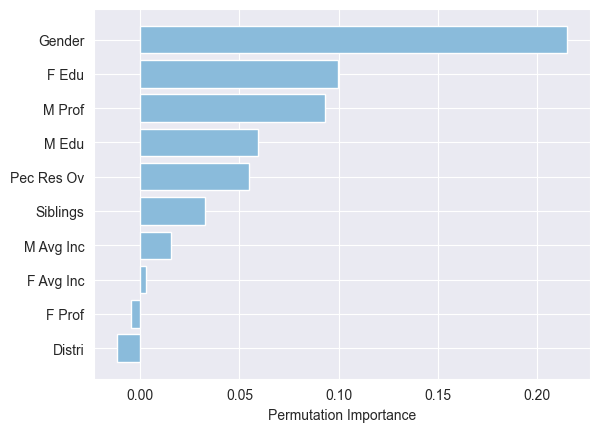

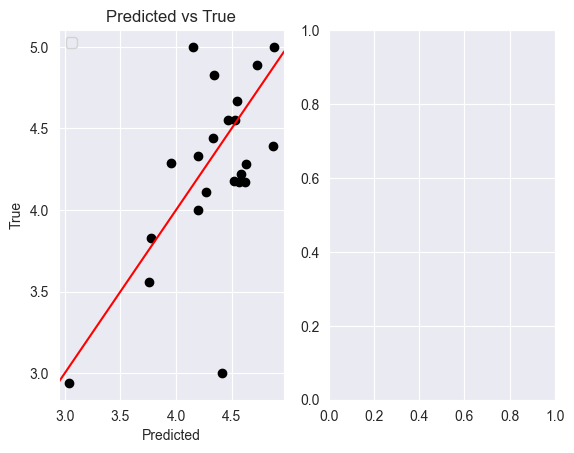

In [ ]:
from sklearn.svm import SVR
svr = SVR(kernel = 'rbf')
svr.fit(X_train,y_train)

y_pred_test_x_svr = svr.predict(X_test)
metrics("SVR",y_pred_test_x_svr)
feature_importance(svr)
predicted_plot(y_pred_test_x_svr)

Mean Absolute Error:  0.3022937628533082
Mean Squared Error:  0.4186600894638037
R2 score:  0.3901838862141256
Explained Variance:  0.409255374846099
max_error:  1.4242999999999988
neg_mean_poisson_deviance:  0.0425407772559166
neg_mean_gamma_deviance:  0.010425020806283674
neg_mean_absolute_percentage_error:  0.07660596640504501
d2_tweedie_score:  0.3901838862141256
mape_:  7.660596640504501


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


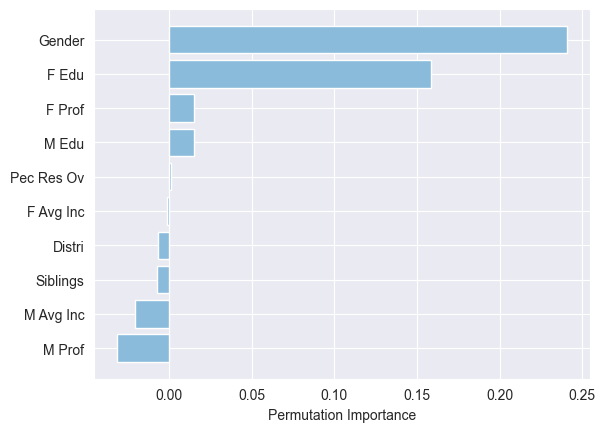

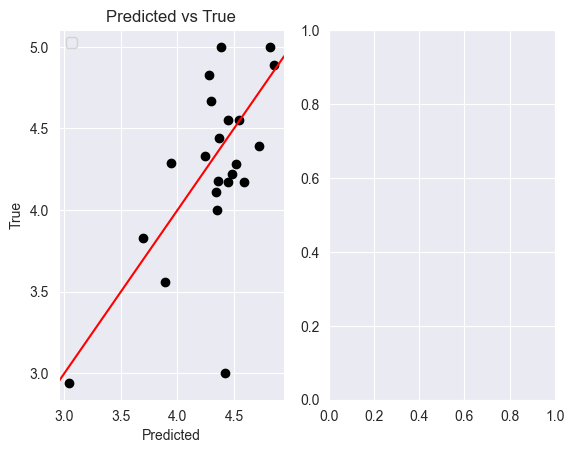

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf_regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
rf_regressor.fit(X_train,y_train)

y_pred_test_x_rf = rf_regressor.predict(X_test)
metrics("Random Forest",y_pred_test_x_rf)
feature_importance(rf_regressor)
predicted_plot(y_pred_test_x_rf)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Mean Absolute Error:  0.3015792287024561
Mean Squared Error:  0.4035899672169308
R2 score:  0.43329571635791875
Explained Variance:  0.45405663409925323
max_error:  1.325009978071666
neg_mean_poisson_deviance:  0.0396811516490629
neg_mean_gamma_deviance:  0.009769404480567683
neg_mean_absolute_percentage_error:  0.07580747948001772
d2_tweedie_score:  0.43329571635791875
mape_:  7.580747948001772


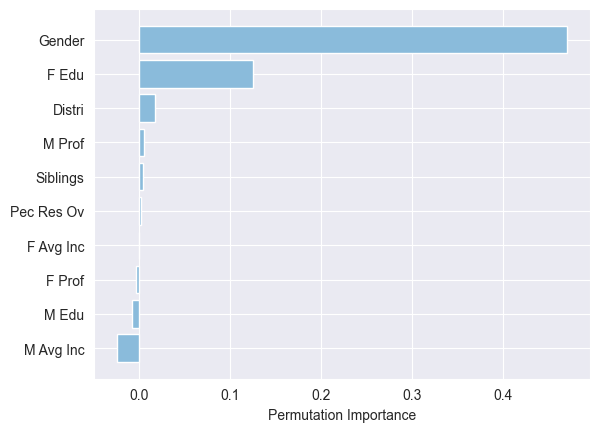

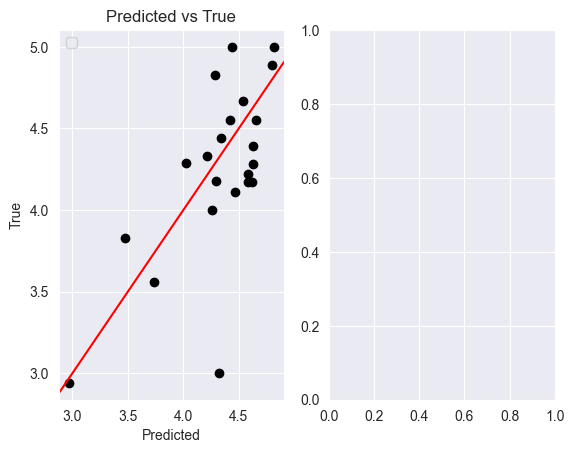

In [ ]:
from sklearn import linear_model
lr = linear_model.LinearRegression()
lr.fit(X_train, y_train)

y_pred_test_x_lr = lr.predict(X_test)
metrics("Linear Regression",y_pred_test_x_lr)
feature_importance(lr)
predicted_plot(y_pred_test_x_lr)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Mean Absolute Error:  0.27142378459401756
Mean Squared Error:  0.4013905381480806
R2 score:  0.43945557996079465
Explained Variance:  0.46487668505476143
max_error:  1.3999999999999995
neg_mean_poisson_deviance:  0.03925856246791055
neg_mean_gamma_deviance:  0.009658754484909281
neg_mean_absolute_percentage_error:  0.06927295081755519
d2_tweedie_score:  0.43945557996079465
mape_:  6.927295081755519


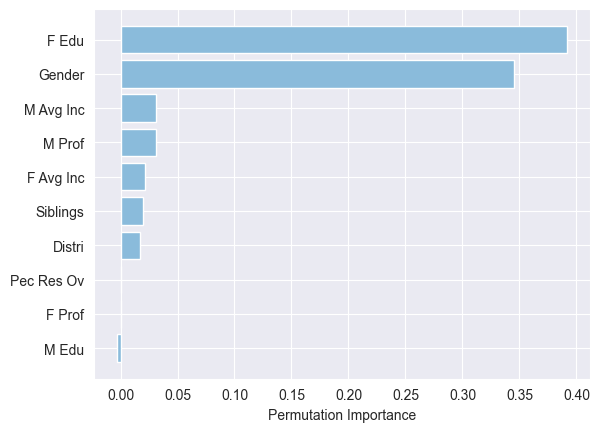

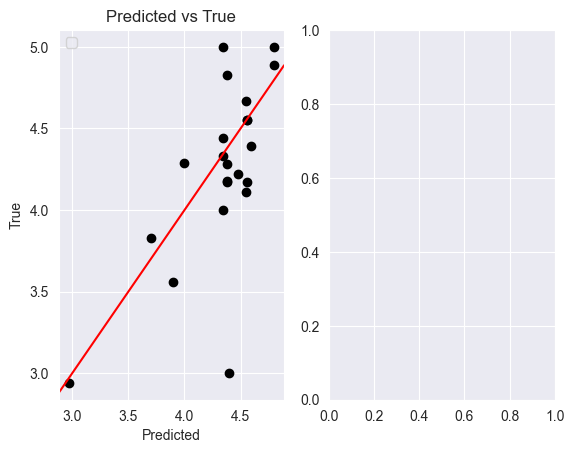

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
ADA = AdaBoostRegressor(n_estimators=5, random_state=42)
ADA.fit(X_train, y_train)

y_pred_test_x_ada = ADA.predict(X_test)
metrics("ADA Boost Regressor",y_pred_test_x_ada)
feature_importance(ADA)
predicted_plot(y_pred_test_x_ada)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Mean Absolute Error:  0.3014217120950872
Mean Squared Error:  0.4240904893549073
R2 score:  0.3742615553758811
Explained Variance:  0.39616724500679235
max_error:  1.425724983215332
neg_mean_poisson_deviance:  0.04350977133909704
neg_mean_gamma_deviance:  0.010625145147389648
neg_mean_absolute_percentage_error:  0.07600468861619072
d2_tweedie_score:  0.374261555375881
mape_:  7.600468861619072


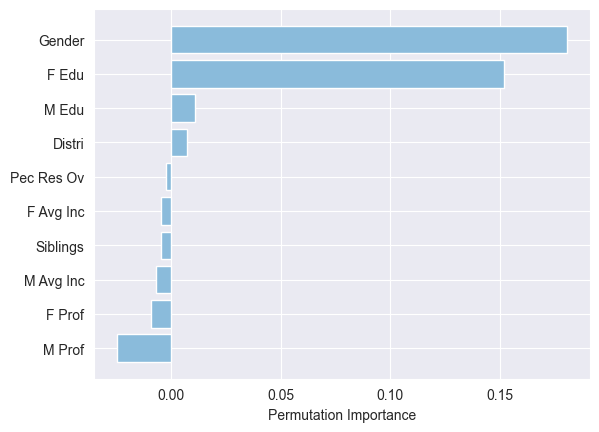

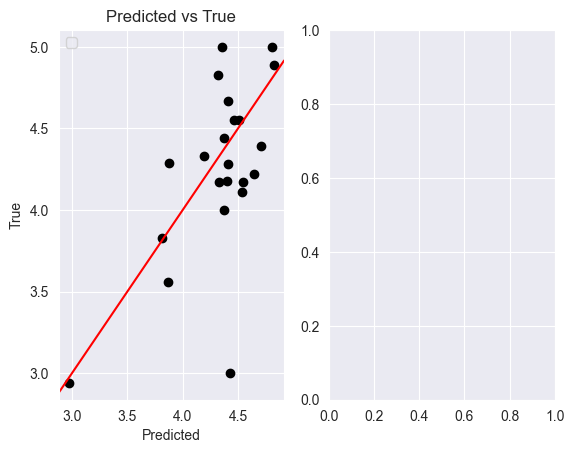

In [ ]:
import xgboost
XG = xgboost.XGBRFRegressor()
XG.fit(X_train, y_train)

y_pred_test_x_XG = XG.predict(X_test)
metrics("XGBoost",y_pred_test_x_XG)
feature_importance(XG)
predicted_plot(y_pred_test_x_XG)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Mean Absolute Error:  0.3532565870584769
Mean Squared Error:  0.4552525594609923
R2 score:  0.27892479123853
Explained Variance:  0.34989580318110614
max_error:  0.9950779470967785
neg_mean_poisson_deviance:  0.04953240325480996
neg_mean_gamma_deviance:  0.012265018663258303
neg_mean_absolute_percentage_error:  0.08918830698882597
d2_tweedie_score:  0.27892479123853
mape_:  8.918830698882598


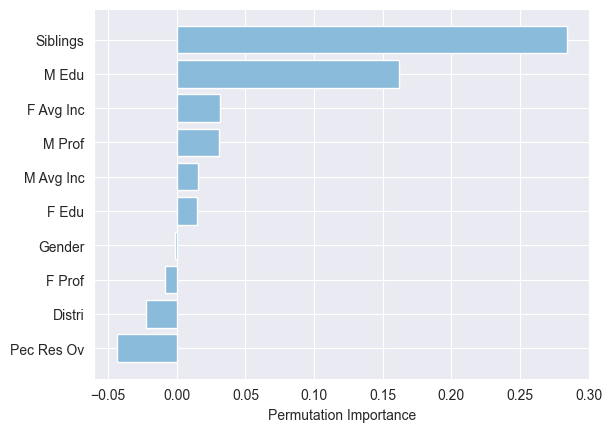

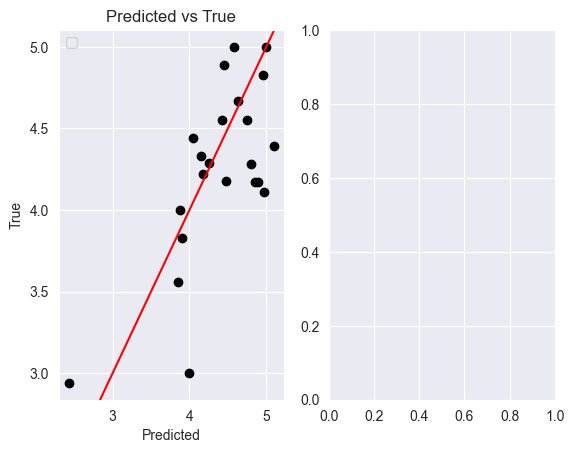

In [ ]:
from sklearn.neural_network import MLPRegressor
MLP = MLPRegressor(random_state=42, max_iter=2000)
MLP.fit(X_train, y_train)

y_pred_test_x_MLP = MLP.predict(X_test)
metrics("MLP",y_pred_test_x_MLP)
feature_importance(MLP)
predicted_plot(y_pred_test_x_MLP)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Mean Absolute Error:  0.33965709409007616
Mean Squared Error:  0.46262176972541397
R2 score:  0.25539164766956646
Explained Variance:  0.2707586664193681
max_error:  1.3421815236421244
neg_mean_poisson_deviance:  0.053333983457092705
neg_mean_gamma_deviance:  0.01345255423675007
neg_mean_absolute_percentage_error:  0.0883893563586899
d2_tweedie_score:  0.25539164766956635
mape_:  8.83893563586899


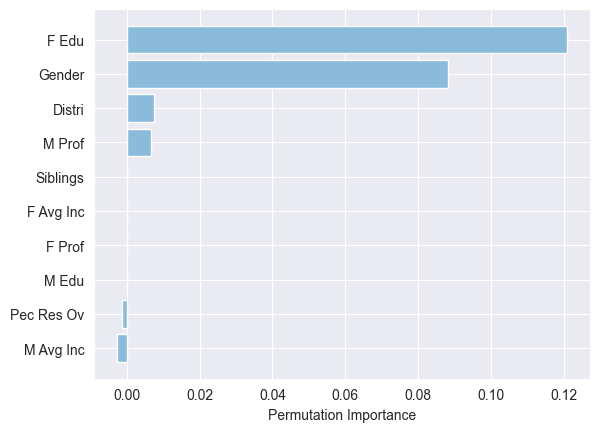

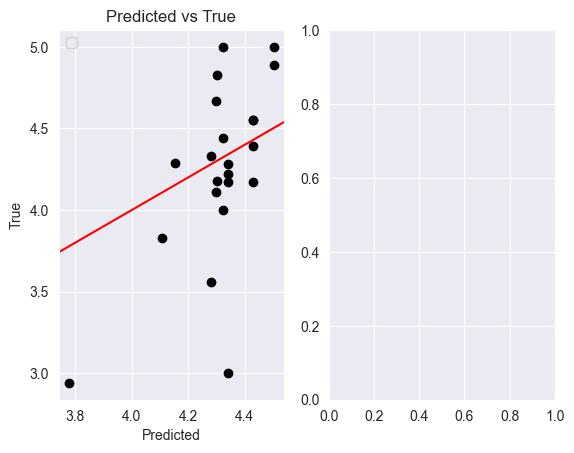

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
GRADIENT = GradientBoostingRegressor(n_estimators=5, random_state=42)
GRADIENT.fit(X_train, y_train)

y_pred_test_x_GRADIENT = GRADIENT.predict(X_test)
metrics("GRADIENT",y_pred_test_x_GRADIENT)
feature_importance(GRADIENT)
predicted_plot(y_pred_test_x_GRADIENT)

In [ ]:
estimator=[]
for i in range(1, 30):
    model = GradientBoostingRegressor(n_estimators=i, random_state=42)
    model.fit(X_train, y_train)
    score = model.score(X_test, y_test)
    estimator.append(score)

(estimator.index(max(estimator)))+1

16

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Mean Absolute Error:  0.3044088022153064
Mean Squared Error:  0.40773992861855024
R2 score:  0.42158139028324715
Explained Variance:  0.45964390994391924
max_error:  1.32528675882594
neg_mean_poisson_deviance:  0.04084277353447486
neg_mean_gamma_deviance:  0.010152013485269628
neg_mean_absolute_percentage_error:  0.07797569733653952
d2_tweedie_score:  0.42158139028324715
mape_:  7.797569733653951


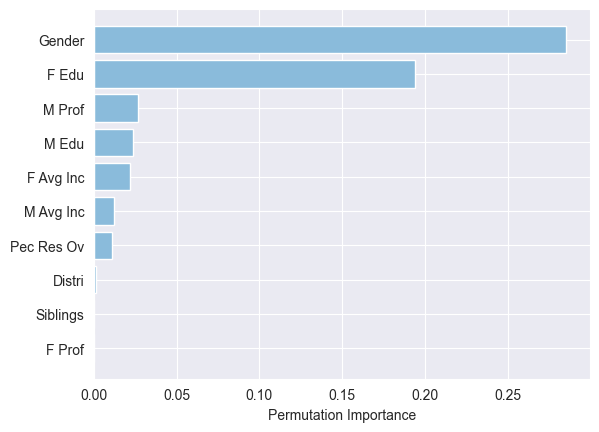

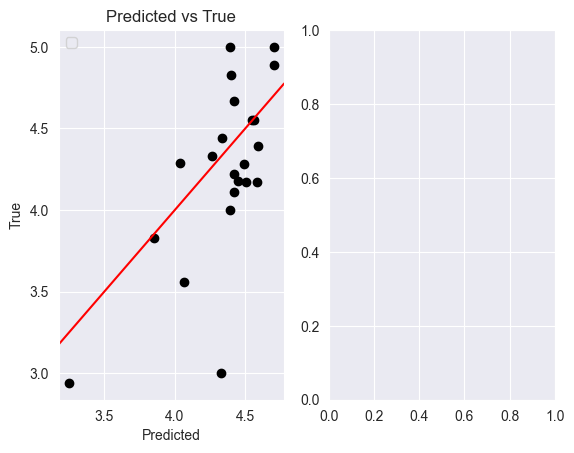

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
GRADIENT = GradientBoostingRegressor(n_estimators= 17, random_state=42)
GRADIENT.fit(X_train, y_train)

y_pred_test_x_GRADIENT = GRADIENT.predict(X_test)
metrics("Optimized GRADIENT",y_pred_test_x_GRADIENT)
feature_importance(GRADIENT)
predicted_plot(y_pred_test_x_GRADIENT)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Mean Absolute Error:  0.3584999999999998
Mean Squared Error:  0.44368575079051764
R2 score:  0.3151006803073175
Explained Variance:  0.4272004390656273
max_error:  1.2509999999999994
neg_mean_poisson_deviance:  0.04763686875890489
neg_mean_gamma_deviance:  0.011678521080365782
neg_mean_absolute_percentage_error:  0.09150440610263867
d2_tweedie_score:  0.3151006803073175
mape_:  9.150440610263868


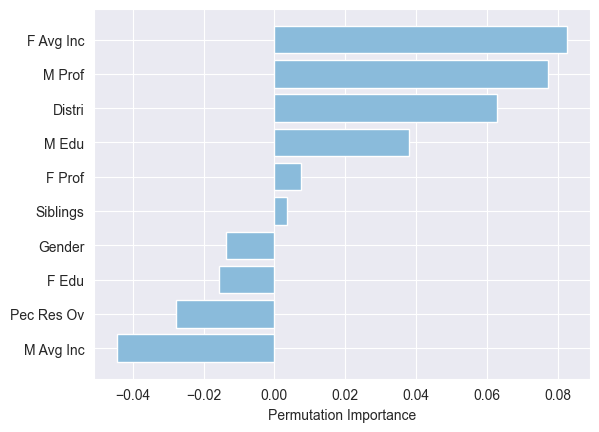

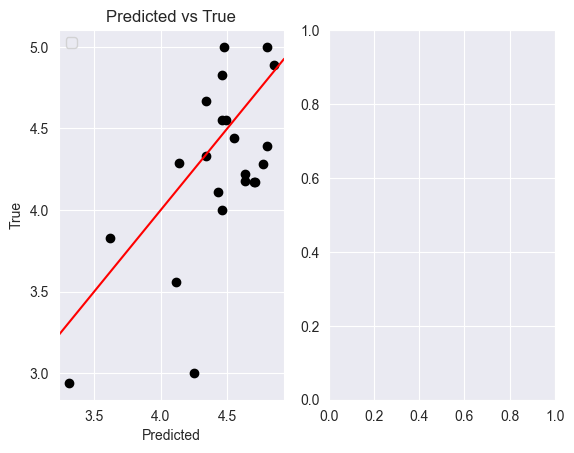

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors=10)
knn.fit(X_train, y_train)

y_pred_test_x_knn = knn.predict(X_test)
metrics("KNN",y_pred_test_x_knn)
feature_importance(knn)
predicted_plot(y_pred_test_x_knn)

In [ ]:
df = pd.DataFrame(l, columns=["model_name", "explained_variance", "max_error", "mean", "rmse", "r2","mape", "mean_poisson_deviance", "mean_gamma_deviance", "mean_absolute_percentage_error", "d2_tweedie_score"])
df

,model_name,explained_variance,max_error,mean,rmse,r2,mape,mean_poisson_deviance,mean_gamma_deviance,mean_absolute_percentage_error,d2_tweedie_score
0,SVR,0.357269,1.414614,0.314656,0.439164,0.328991,7.884906,0.046281,0.011215,0.078849,0.328991
1,Random Forest,0.409255,1.424300,0.302294,0.418660,0.390184,7.660597,0.042541,0.010425,0.076606,0.390184
2,Linear Regression,0.454057,1.325010,0.301579,0.403590,0.433296,7.580748,0.039681,0.009769,0.075807,0.433296
3,ADA Boost Regressor,0.464877,1.400000,0.271424,0.401391,0.439456,6.927295,0.039259,0.009659,0.069273,0.439456
4,XGBoost,0.396167,1.425725,0.301422,0.424090,0.374262,7.600469,0.043510,0.010625,0.076005,0.374262
5,MLP,0.349896,0.995078,0.353257,0.455253,0.278925,8.918831,0.049532,0.012265,0.089188,0.278925
6,GRADIENT,0.270759,1.342182,0.339657,0.462622,0.255392,8.838936,0.053334,0.013453,0.088389,0.255392
7,Optimized GRADIENT,0.459644,1.325287,0.304409,0.407740,0.421581,7.797570,0.040843,0.010152,0.077976,0.421581
8,KNN,0.427200,1.251000,0.358500,0.443686,0.315101,9.150441,0.047637,0.011679,0.091504,0.315101


In [ ]:
# import shap library
import shap

# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(rf_regressor)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation
# shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values[0,:], X_train[0])
# visualize the first prediction's explanation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])


In [ ]:
import lime
import lime.lime_tabular
# LIME has one explainer for all the models
# explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names= feature_names,
#                                                   class_names=['MEDV'], verbose=True, mode='regression')
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names= feature_names,
                                                  class_names=['MEDV'], verbose=True, mode='regression')


In [ ]:
explainer

In [ ]:
j = 5
# exp = explainer.explain_instance(X_test[j], rf_regressor.predict, num_features=6)
exp = explainer.explain_instance(X_test.iloc[j], rf_regressor.predict, num_features=6)

# Show the predictions
exp.show_in_notebook(show_table=True)


Intercept 4.530475479382116
Prediction_local [3.59503222]
Right: 3.0394000000000005


In [ ]:
j = 7
# exp = explainer.explain_instance(X_test[j], rf_regressor.predict, num_features=6)
exp = explainer.explain_instance(X_test.iloc[j], rf_regressor.predict, num_features=6)

# Show the predictions
exp.show_in_notebook(show_table=True)

Intercept 4.189985440136128
Prediction_local [4.29198272]
Right: 4.424299999999999


In [ ]:
j = 16
# exp = explainer.explain_instance(X_test[j], rf_regressor.predict, num_features=6)
exp = explainer.explain_instance(X_test.iloc[j], rf_regressor.predict, num_features=6)

# Show the predictions
exp.show_in_notebook(show_table=True)

Intercept 4.3834811488100005
Prediction_local [3.74597175]
Right: 3.946099999999999


In [ ]:
test = y_test
test = test.to_numpy()

In [ ]:
for i in range(10,15):
    # exp = explainer.explain_instance(X_test[i], rf_regressor.predict, num_features=6)
    exp = explainer.explain_instance(X_test.iloc[j], rf_regressor.predict, num_features=6)
    print("Y True: ", test[i])
    # Show the predictions
    exp.show_in_notebook(show_table=True)

Intercept 4.381907572359183
Prediction_local [3.74091839]
Right: 3.946099999999999
Y True:  4.11


Intercept 4.374035973971985
Prediction_local [3.75997842]
Right: 3.946099999999999
Y True:  4.17


Intercept 4.379577295698876
Prediction_local [3.7518734]
Right: 3.946099999999999
Y True:  3.56


Intercept 4.381618970846416
Prediction_local [3.75098171]
Right: 3.946099999999999
Y True:  4.0


Intercept 4.375147320137222
Prediction_local [3.75903417]
Right: 3.946099999999999
Y True:  4.67
